<a href="https://colab.research.google.com/github/glombardo/Research/blob/main/Safe_Water_Diffusion_Simulation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Run the cel below and interact with the simulation!

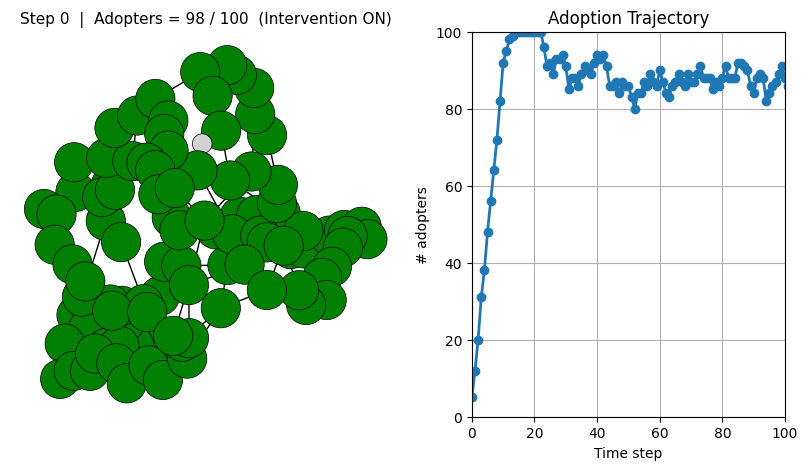

In [6]:
import random, math, networkx as nx
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, clear_output

#Simulation parameters
N                 = 100     # households (nodes)
k                 = 4       # ring neighbours in Watts–Strogatz lattice
p                 = 0.10    # rewiring probability  (small-worldiness)
TOTAL_STEPS       = 100      # total time steps to animate
INTERVENTION_STEPS= 20      # num. steps with high contagion
LAMBDA_INT        = 1.0     # contagion rate during intervention
LAMBDA_POST       = 0.4     # contagion rate after intervention
DROPOUT_PROB      = 0.05    # probability an adopter drops after intervention
SEED_FRACTION     = 0.05    # initially adopted fraction
random.seed(42)

#Build small-world network
G   = nx.watts_strogatz_graph(N, k, p, seed=1)
pos = nx.spring_layout(G, seed=2)  # fixed layout for all frames

#Initial adoption status
adopted = [False]*N
for idx in random.sample(range(N), int(SEED_FRACTION*N)):
    adopted[idx] = True

adoption_history = [sum(adopted)]  # store # adopters each step

#Matplotlib figure setup
plt.rcParams["figure.figsize"] = (10,5)
fig, (ax_net, ax_line) = plt.subplots(1, 2, gridspec_kw={"width_ratios":[1.25,1]})
ax_net.axis("off")
ax_line.set_xlim(0, TOTAL_STEPS)
ax_line.set_ylim(0, N)
ax_line.set_xlabel("Time step")
ax_line.set_ylabel("# adopters")
ax_line.grid(True)

# pre-draw fixed elements
line_plot, = ax_line.plot([], [], lw=2, color="tab:blue", marker="o")

#Helper to get edges whose endpoints adopted
def visible_edges(adopted_status):
    return [(u,v) for u,v in G.edges() if adopted_status[u] and adopted_status[v]]

#Simulation update
def update(frame):
    global adopted, adoption_history

    # ----- 6a. Diffusion logic -----
    new_adopted = adopted.copy()
    lambda_now  = LAMBDA_INT if frame <= INTERVENTION_STEPS else LAMBDA_POST

    for i in range(N):
        if adopted[i]:
            # possible drop-out after intervention ends
            if frame > INTERVENTION_STEPS and random.random() < DROPOUT_PROB:
                new_adopted[i] = False

        else:  # still susceptible
            neigh        = list(G.neighbors(i))
            frac_adopted = sum(adopted[j] for j in neigh) / len(neigh) if neigh else 0
            if random.random() < lambda_now * frac_adopted:
                new_adopted[i] = True

    adopted = new_adopted
    adoption_history.append(sum(adopted))

    # ----- 6b. Draw network -----
    ax_net.clear(); ax_net.axis("off")
    node_colors = ["green" if state else "lightgray" for state in adopted]
    node_sizes  = [800 if state else 200 for state in adopted]
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes,
                           edgecolors="black", linewidths=0.5, ax=ax_net)
    nx.draw_networkx_edges(G, pos, edgelist=visible_edges(adopted),
                           width=1.0, ax=ax_net)
    title = f"Step {frame}  |  Adopters = {sum(adopted)} / {N}"
    title += "  (Intervention ON)" if frame<=INTERVENTION_STEPS else "  (Intervention OFF)"
    ax_net.set_title(title, fontsize=11)

    # ----- 6c. Update adoption trajectory -----
    line_plot.set_data(range(len(adoption_history)), adoption_history)
    ax_line.set_title("Adoption Trajectory")

    return ()

#Run animation
anim = FuncAnimation(fig, update, frames=TOTAL_STEPS+1, interval=700, blit=False)

HTML(anim.to_jshtml())  # Better for Colab than to_html5_video()
